In [25]:
from diffusers import DiffusionPipeline
import torch

pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [26]:
pipeline.to("cuda")
generator = torch.Generator("cuda").manual_seed(214)

In [7]:
image = pipeline("image of a projection of words generating a shadow in a cave as a reader reads a book.").images[0]


  0%|          | 0/50 [00:00<?, ?it/s]

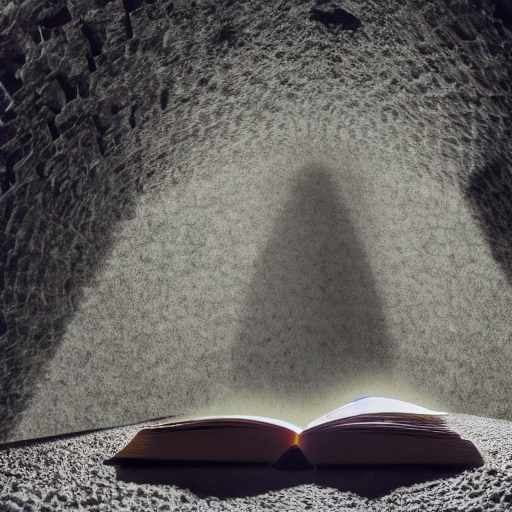

In [10]:
image.images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

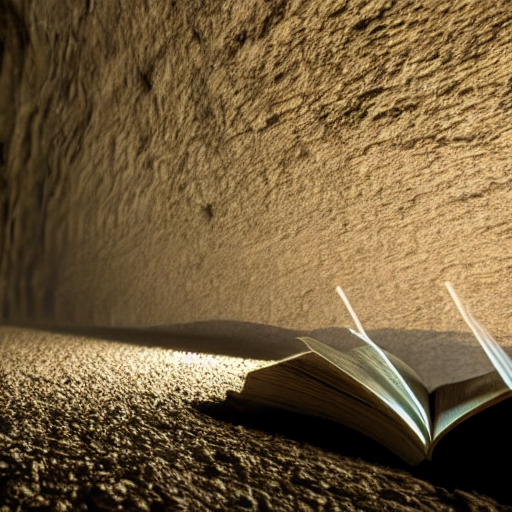

In [19]:
image = pipeline("image of a projection of words generating a shadow in a cave as a reader reads a book.").images[0]
image

  0%|          | 0/20 [00:00<?, ?it/s]

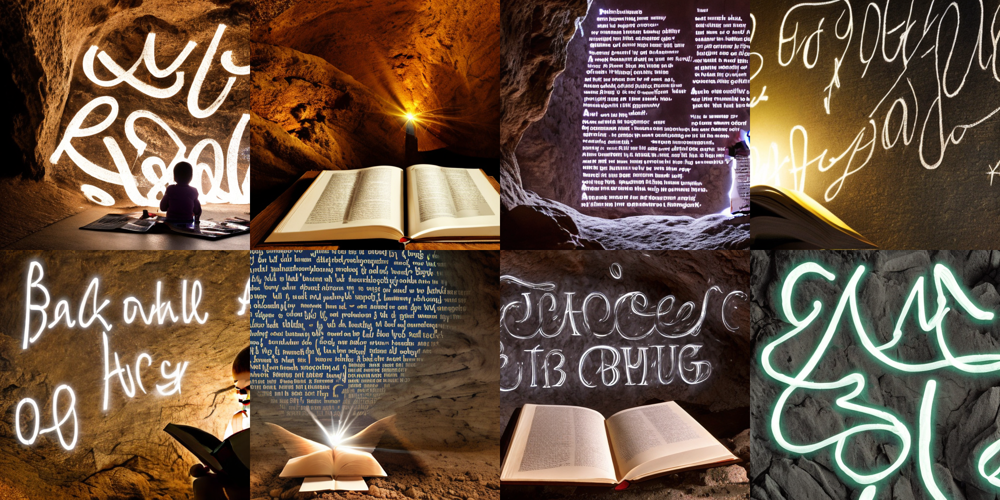

In [34]:
from diffusers import AutoencoderKL
from PIL import Image

prompt = "beautiful, 4k image of a of backlight words upon the wall of a cave. The words are glowing beautiful in cursive. There is a young human reading the book and the words on the book are glowing too."

def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}




def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to("cuda")
pipeline.vae = vae
images = pipeline(**get_inputs(batch_size=8)).images
image_grid(images, rows=2, cols=4)

  0%|          | 0/20 [00:00<?, ?it/s]

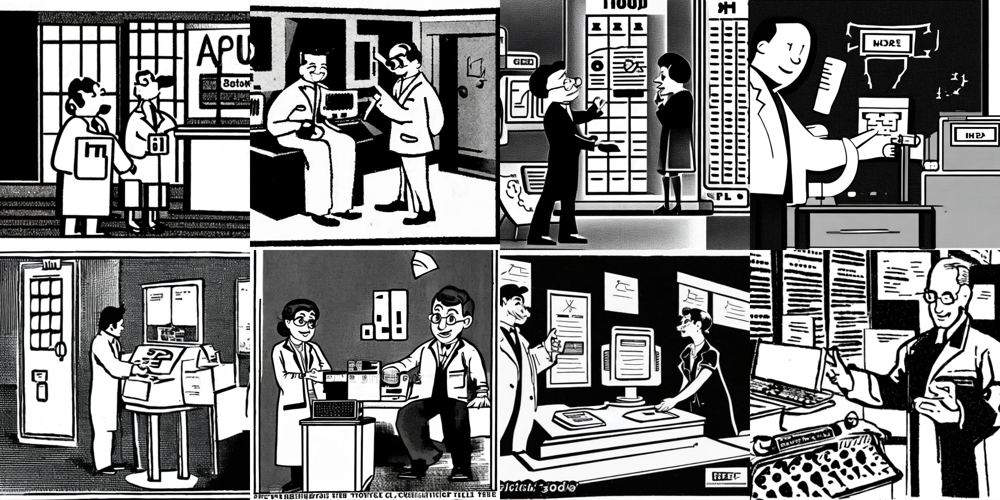

In [44]:

second_prompt = """crisp, black and white cartoon as if a cartoon in a newspaper of an old fashioned computer modem. It is behind a game show podium and a scientist in a white coat instructing and researching it."""
def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [second_prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}




def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to("cuda")
pipeline.vae = vae
images = pipeline(**get_inputs(batch_size=8)).images
image_grid(images, rows=2, cols=4)

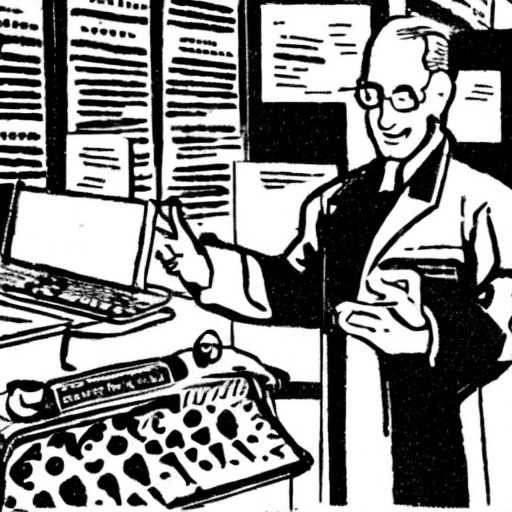

In [48]:
images[7]

  0%|          | 0/50 [00:00<?, ?it/s]

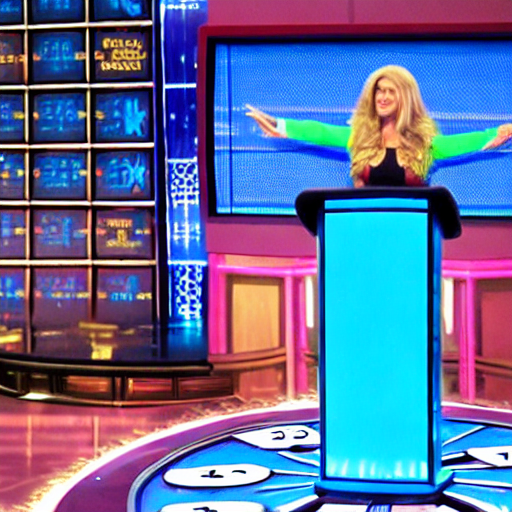

In [22]:
second_image = pipeline("""a picture of a computer at a podium guessing letters and words in wheel of fortune with Vanna White being some scientist with a pointer as if on a chalkboard instructing the machine that is guessing… The podium could have accumulated some points because some of the words on the board are guessed correctly""").images[0]

second_image

  0%|          | 0/50 [00:00<?, ?it/s]

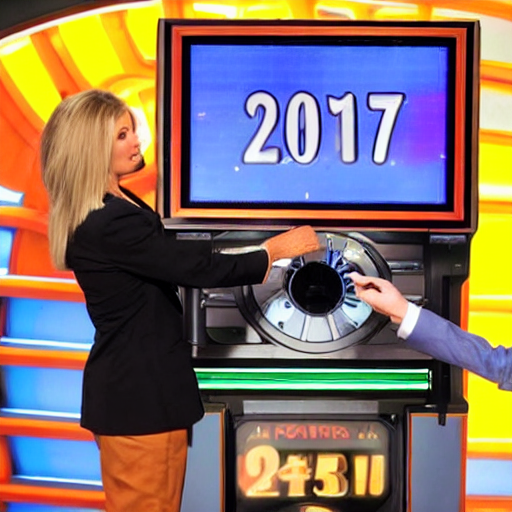

In [23]:
second_image = pipeline("""a picture of a computer at a podium guessing letters and words in wheel of fortune with Vanna White being some scientist with a pointer as if on a chalkboard instructing the machine that is guessing… The podium could have accumulated some points because some of the words on the board are guessed correctly""").images[0]

second_image

In [ ]:
generator = torch.Generator("cuda").manual_seed(0)

  0%|          | 0/50 [00:00<?, ?it/s]

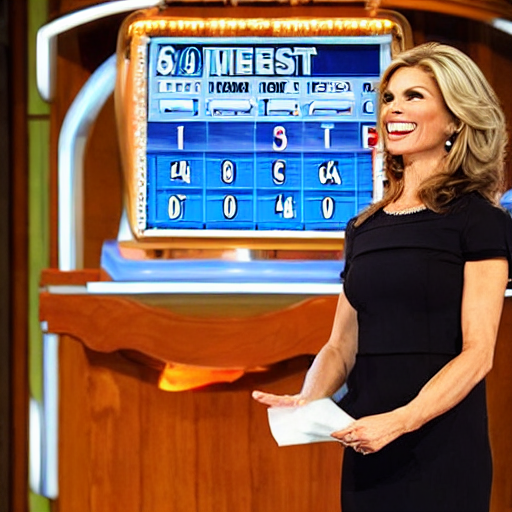

In [24]:
second_image = pipeline("""a picture of a computer at a podium guessing letters and words in wheel of fortune with Vanna White being some scientist with a pointer as if on a chalkboard instructing the machine that is guessing… The podium could have accumulated some points because some of the words on the board are guessed correctly""").images[0]

second_image